# Exploratory Analysis
In this portion of our analysis, we use maps and correlation analysis to address the folowing questions:
- What is the amenity landscape in Philadelphia like, beyond the downtown area?
- How much variation is there within amenity categories, such as restaurants?

In [448]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import altair as alt
import hvplot.pandas as hv
from sklearn.cluster import KMeans
import re
from wordcloud import WordCloud
from sklearn.preprocessing import MinMaxScaler, RobustScaler
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
echo: False


# Show all columns in dataframes
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)

np.seterr(invalid="ignore");

In [479]:
# amenities
amenity_summed = gpd.read_file("data/amenities_grouped.csv")
amenity_point = gpd.read_file("data/amenities_phl_gdf.geojson")
amenity_neigh = gpd.read_file("data/amenities_neigh.geojson")
amenity_tract = gpd.read_file("data/amenities_tract.geojson")

In [480]:
# boundaries 
phl_bound = gpd.read_file("data/Yelp API/phl_bound.geojson")
phl_neigh = gpd.read_file("https://raw.githubusercontent.com/opendataphilly/open-geo-data/master/Neighborhoods_Philadelphia/Neighborhoods_Philadelphia.geojson")
phl_tract = gpd.read_file("data/tract.geojson")
districts = gpd.read_file("data/Planning_Districts.geojson")

# reproject boundaries
phl_bound_proj = phl_bound.to_crs(2272)
phl_neigh_proj = phl_neigh.to_crs(2272)
phl_tract_proj = phl_tract.to_crs(2272)
districts_proj = districts.to_crs(2272)

neigh = phl_neigh_proj[["mapname", "geometry"]].copy()
neigh["nb_name"] = neigh["mapname"]

district = districts_proj[["DIST_NAME", "geometry"]].copy()

district = district.copy()
# Calculate area in square meters
district['area_m2'] = district['geometry'].area

# Convert area to square miles (1 square mile = 2,589,988.11 square meters)
district['area_mi2'] = district['area_m2'] / 27878400

## Where are Philly's amenities found?

After cleaning our data from the Yelp Fusion API, we have a dataframe of 7579 total entries, with just over 5000 unique amenities.

In [451]:
amenity_point["name"].nunique()

5441

Below are the point locations of the amenities we pulled from the API, colored by their category.

In [452]:
amenity_point.explore(tiles='CartoDB dark_matter', legend=True, column='type')

In sheer count and density, the Center City region is the most populated with amenities. 

In [453]:
amenity_neigh_sum = amenity_neigh.groupby("nb_name")["count_per_mi2"].sum().reset_index()
amenity_neigh_sum = amenity_neigh_sum.merge(amenity_neigh[["geometry", "nb_name"]], on = "nb_name", how = "left")
amenity_neigh_sum = gpd.GeoDataFrame(amenity_neigh_sum, geometry = "geometry")
amenity_neigh_sum["count_per_mi2"] = amenity_neigh_sum["count_per_mi2"].round(0)
amenity_neigh_sum.explore(tiles='CartoDB dark_matter', legend=True, column='count_per_mi2', cmap='viridis')

The average count of amenities per square mile is 7.8 times higher in the Central planning district (283) compared to the rest of the city (36).

In [454]:
# Step 1: Dissolve non-central districts
not_central = district[district['DIST_NAME'] != "Central"].copy()
not_central['group'] = 'Other Districts'
# Ensure geometry is consistent before dissolve
not_central = not_central.set_geometry('geometry', crs=district.crs)
merged_not_central_gdf = not_central.dissolve(by='group', aggfunc='sum', numeric_only = True).reset_index()
merged_not_central_gdf = merged_not_central_gdf[["group", "geometry", "area_mi2"]]

In [455]:
# Step 2: Separate DataFrame for Central District
central_gdf = district[district['DIST_NAME'] == "Central"].copy()
central_gdf['group'] = 'Center City'
central_gdf = central_gdf[["group", "geometry", "area_mi2"]]

In [456]:
# Step 3: Concatenate both DataFrames
central_comp_gdf = gpd.GeoDataFrame(pd.concat([central_gdf, merged_not_central_gdf], ignore_index=True))

In [457]:
# Group and sum total_amenities by neighborhood
amenity_neigh_sum = amenity_neigh.groupby("nb_name")["total_amenities"].first().reset_index()

# Get unique geometry for each neighborhood
unique_geometry = amenity_neigh[["nb_name", "geometry"]].drop_duplicates()

# Merge the summed data with the unique geometrical data
amenity_neigh_sum_gdf = amenity_neigh_sum.merge(unique_geometry, on="nb_name", how="left")

# Convert to GeoDataFrame
amenity_neigh_sum_gdf = gpd.GeoDataFrame(amenity_neigh_sum_gdf, geometry="geometry")

# Calculate centroid of geometry
amenity_neigh_sum_gdf.geometry = amenity_neigh_sum_gdf.geometry.centroid


# intersect with districts
central_comp = central_comp_gdf.sjoin(amenity_neigh_sum_gdf)

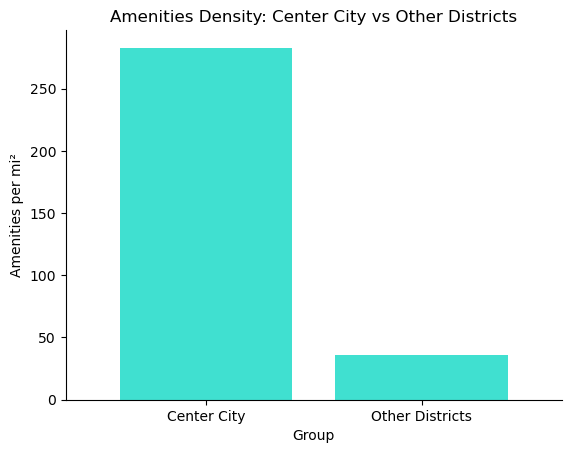

In [458]:
central_comp_sum = central_comp.groupby("group")[["total_amenities"]].sum()
central_comp_area = central_comp.groupby("group")[["area_mi2"]].first()
central_comp_bar = central_comp_sum.merge(central_comp_area, on = "group", how = "inner")
central_comp_bar["amenities_per_mi2"] = central_comp_bar["total_amenities"]/central_comp_bar["area_mi2"].round(2)

# plot
ax = central_comp_bar['amenities_per_mi2'].plot(kind='bar', color='turquoise', width=0.8, title='Amenities Density: Center City vs Other Districts')

# Remove top and right spines (box)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

# Optionally, you can also remove left and bottom spines if you prefer
# ax.spines['left'].set_visible(False)
# ax.spines['bottom'].set_visible(False)

# Adjust other plot settings as needed
ax.set_ylabel('Amenities per mi²')
ax.set_xlabel('Group')
plt.xticks(rotation=0)  # Rotate x-axis labels if needed

# Show the plot
plt.show()

In [459]:
central_comp_gdf = central_comp_gdf.merge(central_comp_bar, on = "group", how = "inner")
central_comp_gdf["amenities_per_mi2"] = central_comp_gdf["amenities_per_mi2"].round(0)

In [460]:
central_comp_gdf[["group", "amenities_per_mi2", "geometry"]].explore(tiles='CartoDB dark_matter', legend=True, column='amenities_per_mi2', categorical = True)

## What is the composition of Philadelphia's amenity landscape?

We used a wide range of terms to pull a range of amenity listings from Yelp's API. The top three categories are restaurant, beauty/grooming, and shopping.

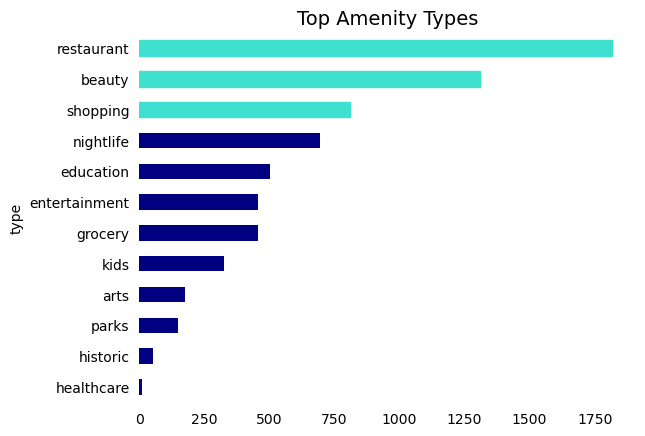

In [461]:
amenity_summed["count"] = amenity_summed["count"].astype(int)
amenities_ranked = amenity_summed[["type", "count"]].sort_values("count", ascending = False)

# Sort the DataFrame in descending order for the plot
amenities_ranked_sorted = amenities_ranked.sort_values('count', ascending=False)

# Create the horizontal bar plot
ax = amenities_ranked_sorted.plot.barh(x="type", y="count", color='navy', legend=False)

# Highlight the top 3 bars
bars = ax.patches
for bar in bars[:3]:  # Change the color of the top 3 bars
    bar.set_color('turquoise')

# Remove the spines (box) around the plot
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)  # Remove the bottom spine (x-axis line)

# Remove the ticks and labels for the x-axis
ax.tick_params(left=False, bottom=False)

# Invert the y-axis to have the highest value at the top
ax.invert_yaxis()

# Add a title
ax.set_title("Top Amenity Types", fontsize=14)

# Show the plot
plt.show()

Mapped separately, we can see distinct patterns in the locations of each type of amenity. Restaurants and beauty amenities lay in clusters spread throughout the city, while parks, arts, and nightlife are most concentrated in Center City. Historic landmarks, by contrast, are concentrated in the Old City area which houses a number of museums and historic sites.

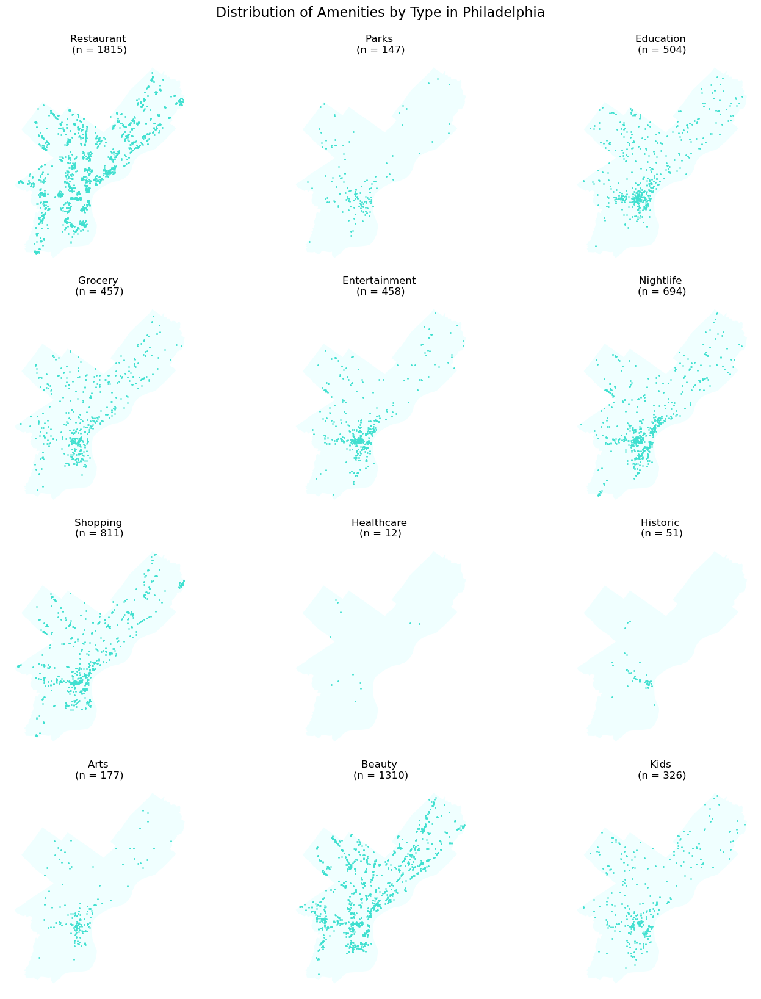

In [462]:
# Extract unique business types
business_types = amenity_point['type'].unique()

# Determine the number of rows and columns for the subplots
n_rows = len(business_types) // 3 + (len(business_types) % 3 > 0)
fig, axes = plt.subplots(n_rows, 3, figsize=(15, n_rows * 4))

# Flatten the axes array for easy looping
axes = axes.flatten()

# Create a map for each business type
for i, business_type in enumerate(business_types):
    # Filter data for the current business type
    subset = amenity_point[amenity_point['type'] == business_type]

    # Get count for the current business type
    count = amenity_summed[amenity_summed['type'] == business_type]['count'].values[0]
    
    # phl boundary
    phl_bound_proj.plot(ax=axes[i], color='azure')
    
    # Plotting with transparency
    subset.plot(ax=axes[i], color='turquoise', markersize=1, alpha=1)

    # Set title with count (n = count)
    axes[i].set_title(f"{business_type.capitalize()} \n(n = {count})")

    # Customizations: Remove boxes, axis ticks, and labels
    axes[i].set_axis_off()

# Remove unused subplots
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])
    
# Adjust layout
plt.tight_layout()

# Add main title for the figure
fig.suptitle('Distribution of Amenities by Type in Philadelphia', fontsize=16, y=1.02)

# Display the panel of maps
plt.show()

## Where are hotspots for each amenity type?

To control for neighborhoods that have higher counts of amenities in general, we also calculate the percentage share of each type of amenity in each neighborhood. This way, we can characterize the spatial footprint of each amenity type independent of variations in amenity density.

Looking at the share of each amenity type in each neighborhood, it appears that amenities such as grocery stores, beauty/grooming services, and restaurants make up a consistently high share of the amenities in neighborhoods across Philadelphia. By contrast, only select neighborhoods are dominated by nightlife, parks, arts, and other forms of entertainment.

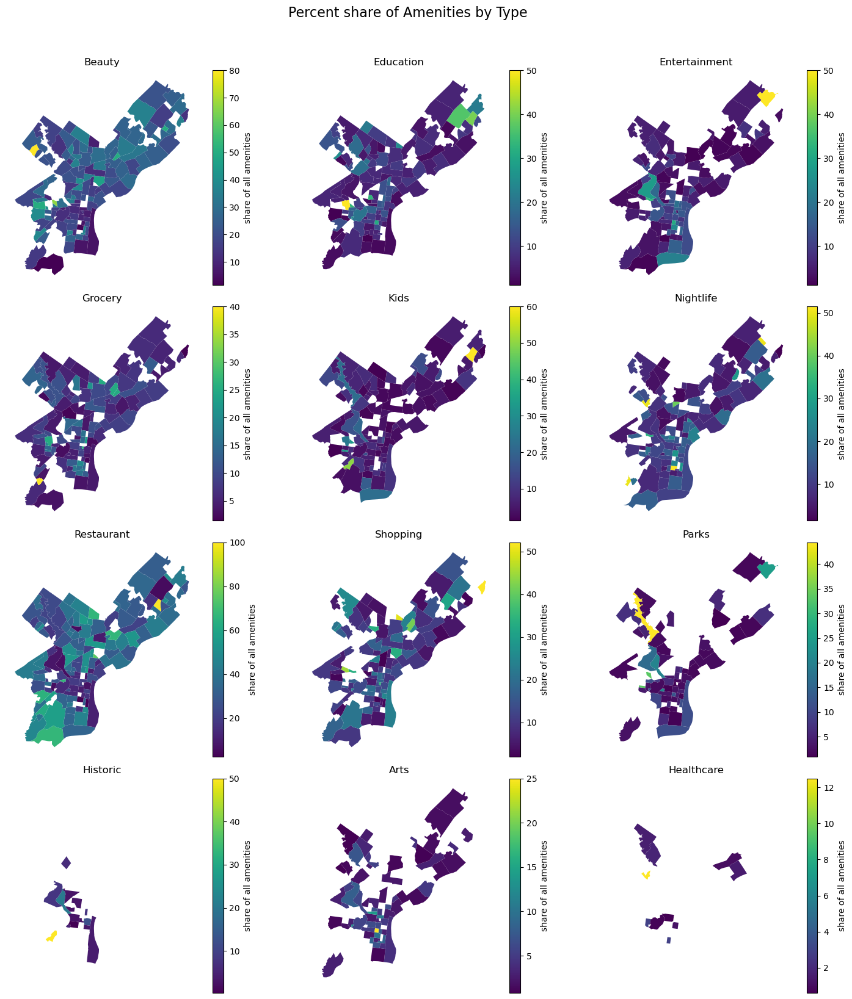

In [463]:
# Extract unique types
amenity_types = amenity_neigh['type'].unique()

# Determine the number of rows and columns for the subplots
n_rows = len(amenity_types) // 3 + (len(amenity_types) % 3 > 0)
fig, axes = plt.subplots(n_rows, 3, figsize=(15, n_rows * 4))

# Flatten the axes array for easy looping
axes = axes.flatten()

# Create a choropleth map for each amenity type
for i, amenity_type in enumerate(amenity_types):
    # Filter data for the current amenity type
    subset = amenity_neigh[amenity_neigh['type'] == amenity_type]
    
    # phl boundary
    phl_bound_proj.plot(ax=axes[i], color='white')
    

    # Plotting
    subset.plot(column='pct_share', ax=axes[i], legend=True,
                legend_kwds={'label': "share of all amenities"},
                cmap='viridis')

    # Set title
    axes[i].set_title(amenity_type.capitalize())
    
     # Remove boxes, axis ticks, and axis labels
    axes[i].set_axis_off()

# Remove unused subplots
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

    
# Add main title for the figure
fig.suptitle('Percent share of Amenities by Type', fontsize=16, y=1.02)


# Adjust layout
plt.tight_layout()

# Display the panel of maps
plt.show()

## Word clouds: yelp listings

The text within the Yelp listings also has a lot of information about the composition of Philadelphia's amenity landscape. First, in a wordcloud of all the titles of the listings, we can see "pizza", "salon", "bar", "school", "studio", "restaurant", and "park" are featured prominently. 

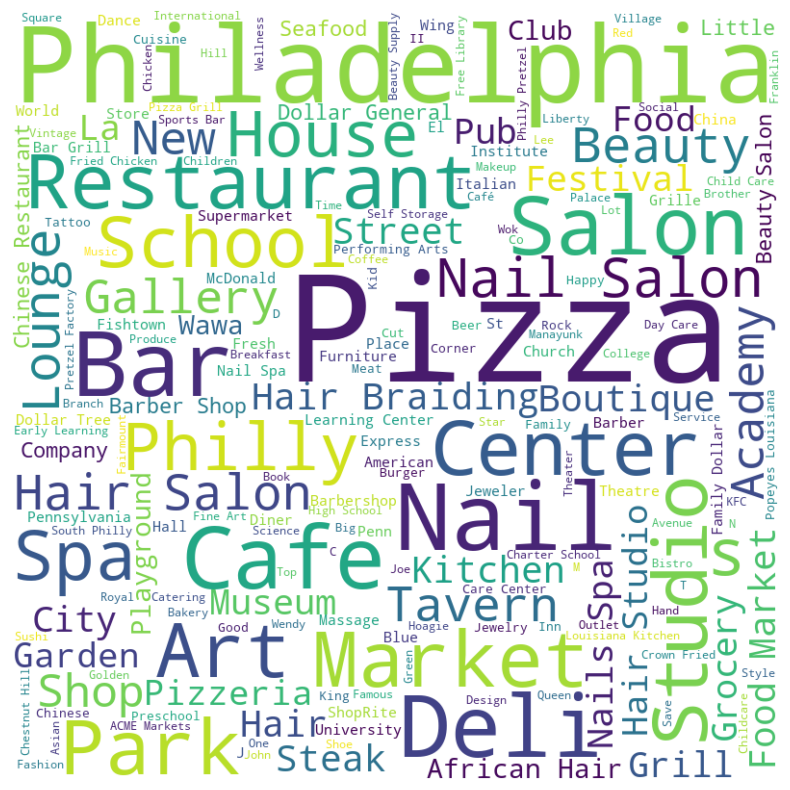

In [464]:
# Concatenate all text in the column
text = ' '.join(amenity_point["name"].dropna())

# Create the word cloud
wordcloud = WordCloud(width=800, height=800, background_color ='white').generate(text)

# Display the word cloud using matplotlib
plt.figure(figsize=(10, 10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

Similarly, looking at the first word in yelp's "alias" field, we see that "bakeries", "cafes", "grocery", "theater", "sandwiches", and "delis" are some of the most prominent descriptions of amenity listings.

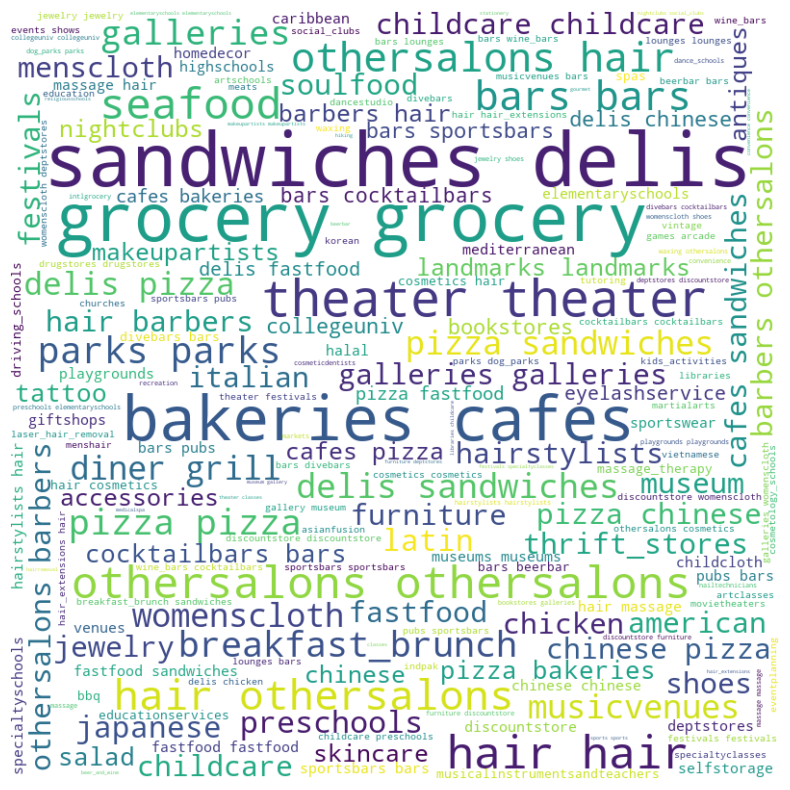

In [465]:
# Concatenate all text in the column
text = ' '.join(amenity_point["desc_1"].dropna())

# Create the word cloud
wordcloud = WordCloud(width=800, height=800, background_color ='white').generate(text)

# Display the word cloud using matplotlib
plt.figure(figsize=(10, 10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

## Amenity type correlations
Looking at the correlations between the neighborhoods that amenity types are found in, we see moderately strong correlations between the locations of entertainment and arts amenities (0.52), kids and historic amenities (0.47), and restaurants and entertainment (-0.5). Overall, there are no categories with correlations over 0.75, suggesting that our categories are distinct and experience different spatial processes.

In [466]:
# spreading the data
amenity_neigh_wide = amenity_neigh.pivot_table(index='nb_name', columns='type', values='pct_share', aggfunc=np.mean).fillna(0)

# Calculating the correlation matrix
correlation_matrix = amenity_neigh_wide.corr()

# Mask to remove upper triangular matrix (including the diagonal)
mask = np.tril(np.ones_like(correlation_matrix, dtype=bool))

# Apply the mask to the correlation matrix
filtered_matrix = correlation_matrix.mask(mask)

# Reset index and melt for Altair
heatmap_data = filtered_matrix.reset_index().melt('type', var_name='type2', value_name='correlation').dropna()

# Create the heatmap
heatmap = alt.Chart(heatmap_data).mark_rect().encode(
    x='type:N',
    y='type2:N',
    color='correlation:Q'
)

# Add text to each cell
text = heatmap.mark_text(baseline='middle').encode(
    text=alt.Text('correlation:Q', format='.2f'),
    color=alt.condition(
        alt.datum.correlation > 0.4, 
        alt.value('white'),
        alt.value('black')
    )
)

# Display the chart
chart = (heatmap + text).properties(width=600, height=600)
chart

alt.LayerChart(...)

#  How do amenities vary geographically?

## Restaurants
The category of restaurants has the highest variation of all our amenity categories. From formal sit-down restaurants to takeaway cheesesteak joints, we wanted to explore the diversity of the Philadelphia food scene. Following are the top 10 food categories, with "pizza" a clear winner at 323 restaurants, or 16.6% of all restaurants in Philly.

In [467]:
restaurants = amenity_point[amenity_point["type"] == "restaurant"]
restaurants_cat = restaurants.groupby("desc_1").size().sort_values(ascending=False).reset_index(name='count')
top_restaurants_cat = restaurants_cat.head(10)

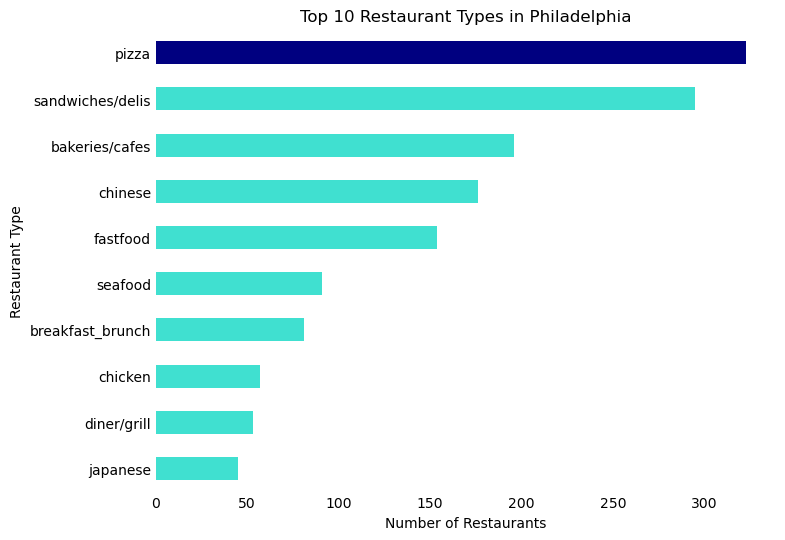

In [468]:
# Sort the DataFrame in descending order of 'count'
top_restaurants_cat_sorted = top_restaurants_cat.sort_values('count', ascending=False)

# Create a color list - default to turquoise, but navy for 'Pizza'
colors = ['navy' if x == 'pizza' else 'turquoise' for x in top_restaurants_cat_sorted['desc_1']]

# Create the horizontal bar plot with reversed axes
ax = top_restaurants_cat_sorted.plot.barh(x='desc_1', y='count', figsize=(8, 6), color=colors)

# Remove the box (spines)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)

# Remove tick marks
ax.tick_params(axis='x', length=0)
ax.tick_params(axis='y', length=0)

# Remove legend
ax.legend().set_visible(False)

# Rename axes
ax.set_xlabel('Number of Restaurants')
ax.set_ylabel('Restaurant Type')

# Invert the y-axis to have the highest value at the top
ax.invert_yaxis()

# Add title
ax.set_title('Top 10 Restaurant Types in Philadelphia')

# Display the plot
plt.show()

Mapping the most common restaurant type by neighborhood, we see that the northeast and far north are the main contributors to the count of pizza shops, while downtown is dominated by bakeries and cafes. 

In [469]:
restaurants_neigh = restaurants.sjoin(neigh)
restaurants_cat_neigh = restaurants_neigh.groupby(["nb_name", "desc_1"]).size().reset_index(name='count')
# get top restaurant type by neighborhood
top_cat_neigh = restaurants_cat_neigh.groupby("nb_name").apply(lambda x: x.nlargest(1, 'count')).reset_index(drop=True)

# join with neighborhoods
top_cat_neigh_gdf = top_cat_neigh.merge(neigh, on = "nb_name", how = "left")
top_cat_neigh_gdf = gpd.GeoDataFrame(top_cat_neigh_gdf, geometry = "geometry")
top_cat_neigh_gdf = top_cat_neigh_gdf[top_cat_neigh_gdf["count"] >= 3]
top_cat_neigh_gdf[["nb_name", "desc_1", "geometry"]].explore(tiles='CartoDB positron', legend=True, column='desc_1', cmap = "Set2")

In [566]:
restaurants_tract = restaurants.sjoin(phl_tract_proj)
restaurants_cat_tract = restaurants_tract.groupby(["nb_name", "desc_1"]).size().reset_index(name='count')

cat_tract = restaurants_cat_tract.groupby(["nb_name", "desc_1"])["count"].sum().reset_index()
# join with neighborhoods
cat_tract_gdf = cat_tract.merge(phl_tract_proj, on = "nb_name", how = "left")

cat_tract_gdf = gpd.GeoDataFrame(cat_tract_gdf, geometry = "geometry")

Following, we can see that just like amenities at large, sub-categories of restaurants also vary in spatial distribution. Some restaurant types such as Chinese and pizza have a consistent presence throughout the city. Others, like Italian and Caribbean, are more concentrated in specific regions.

In [ ]:
# tract base
tract_plot = phl_tract_proj.hvplot(crs=2272, geo=True, color="black", line_color="black", width=800, height=800)

# base
cat_tract_gdf_plot = cat_tract_gdf.hvplot(crs=2272, geo=True, c='count', cmap='magma', hover_cols='all', groupby="desc_1", width=800, height=800)

# combine
final_plot = tract_plot * cat_tract_gdf_plot
# reveal
final_plot = final_plot.opts(title="Restaurant Type by Tract")

final_plot

## Nightlife

The most common nightlife amenity in Philadelphia is a regular bar, followed by specialty bars such as sports bars, wine bars, and pubs.

In [ ]:
nightlife = amenity_point[amenity_point["type"] == "nightlife"]
nightlife_cat = nightlife.groupby("desc_1").size().sort_values(ascending=False).reset_index(name='count')
top_night_cat = nightlife_cat.head(10)

In [ ]:
# Sort the DataFrame in descending order of 'count'
top_night_cat_sorted = top_night_cat.sort_values('count', ascending=False)

# Create a color list - default to turquoise, but navy for 'Pizza'
colors = ['navy' if x == 'bars' else 'turquoise' for x in top_night_cat_sorted['desc_1']]

# Create the horizontal bar plot with reversed axes
ax = top_night_cat_sorted.plot.barh(x='desc_1', y='count', figsize=(8, 6), color=colors)

# Remove the box (spines)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)

# Remove tick marks
ax.tick_params(axis='x', length=0)
ax.tick_params(axis='y', length=0)

# Remove legend
ax.legend().set_visible(False)

# Rename axes
ax.set_xlabel('Number of Establishments')
ax.set_ylabel('Establishment Type')

# Invert the y-axis to have the highest value at the top
ax.invert_yaxis()

# Add title
ax.set_title('Top 10 Nightlife Amenities in Philadelphia')

# Display the plot
plt.show()

Looking at a map of the most common types of nightlife amenities by neighborhood, we see some clear trends. Bars appear consistently throughout the city, while other types of nightlife 

### Center City
Center City, arguably the center of Philadelphia's nightlife, has the most diversity, with neighborhoods dominated by cocktail bars, lounges, pubs, and music venues in addition to regular bars.

### South Philadelphia
South Philadelphia, home of the Eagles, Sixers, Flyers, and Phillies, has a nightlife defined by sports. Accordingly, in Packer Park and the Stadium District, the most prominent forms of nightlife are sportsbars.

### Northeast Philadelphia
Northeast Philadelphia, similar to South, has a nightlife scene centered around primarily sportsbars and pubs.

### Fairmount
The Fairmount area, home to Fairmount Park, the Mann Center, and the Philadelphia Museum of Art, has primarily music venues.

In [557]:
night_neigh = nightlife.sjoin(neigh)
night_cat_neigh = night_neigh.groupby(["nb_name", "desc_1"]).size().reset_index(name='count')
# get top nightlife type by neighborhood
top_cat_neigh = night_cat_neigh.groupby("nb_name").apply(lambda x: x.nlargest(1, 'count')).reset_index(drop=True)

# join with neighborhoods
top_cat_neigh_gdf = top_cat_neigh.merge(neigh, on = "nb_name", how = "left")
top_cat_neigh_gdf = gpd.GeoDataFrame(top_cat_neigh_gdf, geometry = "geometry")
top_cat_neigh_gdf = top_cat_neigh_gdf[top_cat_neigh_gdf["count"] >= 2]
top_cat_neigh_gdf[["nb_name", "desc_1", "geometry"]].explore(tiles='CartoDB positron', legend=True, column='desc_1', cmap = "Set2")

A map of counts of each nightlife amenity type by tract confirms these trends. Bars, while clustered in Center City, are present throughout the city. By contrast, pubs, music venues, and sports bars show distinct hotspots.

In [562]:
night_tract = nightlife.sjoin(phl_tract_proj)
night_cat_tract = night_tract.groupby(["nb_name", "desc_1"]).size().reset_index(name='count')

cat_tract = night_cat_tract.groupby(["nb_name", "desc_1"])["count"].sum().reset_index()
# join with neighborhoods
cat_tract_gdf = cat_tract.merge(phl_tract_proj, on = "nb_name", how = "left")

cat_tract_gdf = gpd.GeoDataFrame(cat_tract_gdf, geometry = "geometry")

In [563]:
# tract base
tract_plot = phl_tract_proj.hvplot(crs=2272, geo=True, color="black", line_color="black", width=800, height=800)

# base
cat_tract_gdf_plot = cat_tract_gdf.hvplot(crs=2272, geo=True, c='count', cmap='magma', hover_cols='all', groupby="desc_1", width=800, height=800)

# combine
final_plot = tract_plot * cat_tract_gdf_plot
# reveal
final_plot = final_plot.opts(title="Nightlife Venue Type by Tract")

final_plot

:DynamicMap   [desc_1]
   :Overlay
      .Polygons.I  :Polygons   [Longitude,Latitude]
      .Polygons.II :Polygons   [Longitude,Latitude]   (count,index,nb_name,desc_1,area_mi2)

## Parks

In [ ]:
## Parks
park = amenity_point[amenity_point["type"] == "parks"]
park_cat = park.groupby("desc_1").size().sort_values(ascending=False).reset_index(name='count')
top_park_cat = park_cat.head(10)

In [ ]:
# Sort the DataFrame in descending order of 'count'
top_park_cat_sorted = top_park_cat.sort_values('count', ascending=False)

# Create a color list - default to turquoise, but navy for 'Pizza'
colors = ['navy' if x == 'parks' else 'turquoise' for x in top_park_cat_sorted['desc_1']]

# Create the horizontal bar plot with reversed axes
ax = top_park_cat_sorted.plot.barh(x='desc_1', y='count', figsize=(8, 6), color=colors)

# Remove the box (spines)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)

# Remove tick marks
ax.tick_params(axis='x', length=0)
ax.tick_params(axis='y', length=0)

# Remove legend
ax.legend().set_visible(False)

# Rename axes
ax.set_xlabel('Count')
ax.set_ylabel('Park Type')

# Invert the y-axis to have the highest value at the top
ax.invert_yaxis()

# Add title
ax.set_title('Top 10 Park Types in Philadelphia')

# Display the plot
plt.show()

In [ ]:
park_neigh = park.sjoin(neigh)
park_cat_neigh = park_neigh.groupby(["nb_name", "desc_1"]).size().reset_index(name='count')
# get top park type by neighborhood
top_cat_neigh = park_cat_neigh.groupby("nb_name").apply(lambda x: x.nlargest(1, 'count')).reset_index(drop=True)

# join with neighborhoods
top_cat_neigh_gdf = top_cat_neigh.merge(neigh, on = "nb_name", how = "left")
top_cat_neigh_gdf = gpd.GeoDataFrame(top_cat_neigh_gdf, geometry = "geometry")
top_cat_neigh_gdf[["nb_name", "desc_1", "geometry"]].explore(tiles='CartoDB positron', legend=True, column='desc_1', cmap = "Set2")

In [565]:
park_tract = park.sjoin(phl_tract_proj)
park_cat_tract = park_tract.groupby(["nb_name", "desc_1"]).size().reset_index(name='count')

cat_tract = park_cat_tract.groupby(["nb_name", "desc_1"])["count"].sum().reset_index()
# join with neighborhoods
cat_tract_gdf = cat_tract.merge(phl_tract_proj, on = "nb_name", how = "left")

cat_tract_gdf = gpd.GeoDataFrame(cat_tract_gdf, geometry = "geometry")

In [ ]:
# tract base
tract_plot = phl_tract_proj.hvplot(crs=2272, geo=True, color="black", line_color="black", width=800, height=800)

# base
cat_tract_gdf_plot = cat_tract_gdf.hvplot(crs=2272, geo=True, c='count', cmap='magma', hover_cols='all', groupby="desc_1", width=800, height=800)

# combine
final_plot = tract_plot * cat_tract_gdf_plot
# reveal
final_plot = final_plot.opts(title="Park Type by Tract")

final_plot

## Shopping

In [ ]:
## shopping
shop = amenity_point[amenity_point["type"] == "shopping"]
shop_cat = shop.groupby("desc_1").size().sort_values(ascending=False).reset_index(name='count')
top_shop_cat = shop_cat.head(10)

In [ ]:
# Sort the DataFrame in descending order of 'count'
top_shop_cat_sorted = top_shop_cat.sort_values('count', ascending=False)

# Create a color list - default to turquoise, but navy for 'Pizza'
colors = ['navy' if x == 'womenscloth' else 'turquoise' for x in top_shop_cat_sorted['desc_1']]

# Create the horizontal bar plot with reversed axes
ax = top_shop_cat_sorted.plot.barh(x='desc_1', y='count', figsize=(8, 6), color=colors)

# Remove the box (spines)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)

# Remove tick marks
ax.tick_params(axis='x', length=0)
ax.tick_params(axis='y', length=0)

# Remove legend
ax.legend().set_visible(False)

# Invert the y-axis to have the highest value at the top
ax.invert_yaxis()

# Rename axes
ax.set_xlabel('Number of Shops')
ax.set_ylabel('Shop Type')

# Add title
ax.set_title('Top 10 Shop Categories in Philadelphia')

# Display the plot
plt.show()

In [471]:
shop_neigh = shop.sjoin(neigh)
shop_cat_neigh = shop_neigh.groupby(["nb_name", "desc_1"]).size().reset_index(name='count')
# get top shop type by neighborhood
top_cat_neigh = shop_cat_neigh.groupby("nb_name").apply(lambda x: x.nlargest(1, 'count')).reset_index(drop=True)

# join with neighborhoods
top_cat_neigh_gdf = top_cat_neigh.merge(neigh, on = "nb_name", how = "left")
top_cat_neigh_gdf = gpd.GeoDataFrame(top_cat_neigh_gdf, geometry = "geometry")
top_cat_neigh_gdf = top_cat_neigh_gdf[top_cat_neigh_gdf["count"] >= 2]
top_cat_neigh_gdf[["nb_name", "desc_1", "geometry"]].explore(tiles='CartoDB positron', legend=True, column='desc_1')

In [569]:
shop_tract = shop.sjoin(phl_tract_proj)
shop_cat_tract = shop_tract.groupby(["nb_name", "desc_1"]).size().reset_index(name='count')

cat_tract = shop_cat_tract.groupby(["nb_name", "desc_1"])["count"].sum().reset_index()
# join with neighborhoods
cat_tract_gdf = cat_tract.merge(phl_tract_proj, on = "nb_name", how = "left")

cat_tract_gdf = gpd.GeoDataFrame(cat_tract_gdf, geometry = "geometry")

In [570]:
# tract base
tract_plot = phl_tract_proj.hvplot(crs=2272, geo=True, color="black", line_color="black", width=800, height=800)

# base
cat_tract_gdf_plot = cat_tract_gdf.hvplot(crs=2272, geo=True, c='count', cmap='magma', hover_cols='all', groupby="desc_1", width=800, height=800)

# combine
final_plot = tract_plot * cat_tract_gdf_plot
# reveal
final_plot = final_plot.opts(title="Shop Type by Tract")

final_plot

:DynamicMap   [desc_1]
   :Overlay
      .Polygons.I  :Polygons   [Longitude,Latitude]
      .Polygons.II :Polygons   [Longitude,Latitude]   (count,index,nb_name,desc_1,area_mi2)

## Education

In [474]:
## edu
edu = amenity_point[amenity_point["type"] == "education"]
edu_cat = edu.groupby("desc_1").size().sort_values(ascending=False).reset_index(name='count')
top_edu_cat = edu_cat.head(10)

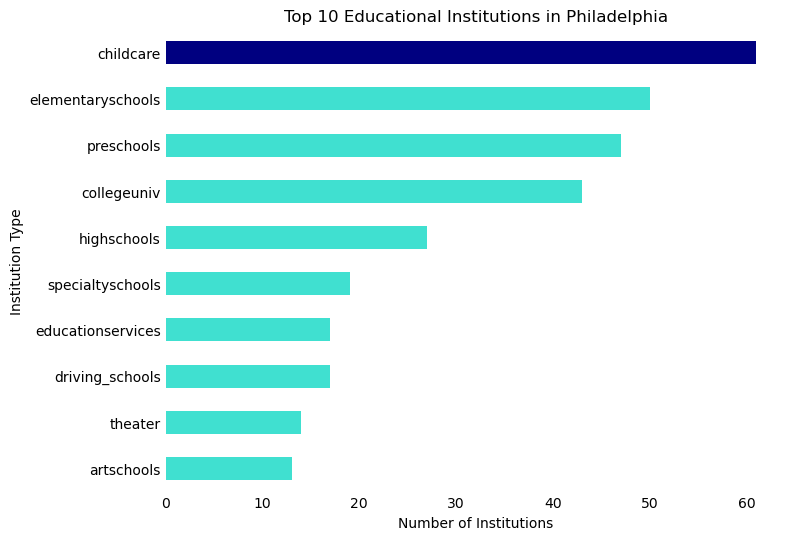

In [475]:
# Sort the DataFrame in descending order of 'count'
top_edu_cat_sorted = top_edu_cat.sort_values('count', ascending=False)

# Create a color list - default to turquoise, but navy for 'Pizza'
colors = ['navy' if x == 'womenscloth' else 'turquoise' for x in top_shop_cat_sorted['desc_1']]

# Create the horizontal bar plot with reversed axes
ax = top_edu_cat_sorted.plot.barh(x='desc_1', y='count', figsize=(8, 6), color=colors)

# Remove the box (spines)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)

# Remove tick marks
ax.tick_params(axis='x', length=0)
ax.tick_params(axis='y', length=0)

# Remove legend
ax.legend().set_visible(False)

# Rename axes
ax.set_xlabel('Number of Institutions')
ax.set_ylabel('Institution Type')

# Invert the y-axis to have the highest value at the top
ax.invert_yaxis()

# Add title
ax.set_title('Top 10 Educational Institutions in Philadelphia')

# Display the plot
plt.show()

In [476]:
edu_neigh = edu.sjoin(neigh)
edu_cat_neigh = edu_neigh.groupby(["nb_name", "desc_1"]).size().reset_index(name='count')
# get top edu type by neighborhood
top_cat_neigh = edu_cat_neigh.groupby("nb_name").apply(lambda x: x.nlargest(1, 'count')).reset_index(drop=True)

# join with neighborhoods
top_cat_neigh_gdf = top_cat_neigh.merge(neigh, on = "nb_name", how = "left")
top_cat_neigh_gdf = gpd.GeoDataFrame(top_cat_neigh_gdf, geometry = "geometry")
top_cat_neigh_gdf = top_cat_neigh_gdf[top_cat_neigh_gdf["count"] >= 2]
top_cat_neigh_gdf[["nb_name", "desc_1", "geometry"]].explore(tiles='CartoDB positron', legend=True, column='desc_1')

In [567]:
edu_tract = edu.sjoin(phl_tract_proj)
edu_cat_tract = edu_tract.groupby(["nb_name", "desc_1"]).size().reset_index(name='count')

cat_tract = edu_cat_tract.groupby(["nb_name", "desc_1"])["count"].sum().reset_index()
# join with neighborhoods
cat_tract_gdf = cat_tract.merge(phl_tract_proj, on = "nb_name", how = "left")

cat_tract_gdf = gpd.GeoDataFrame(cat_tract_gdf, geometry = "geometry")

In [248]:
# tract base
tract_plot = phl_tract_proj.hvplot(crs=2272, geo=True, color="black", line_color="black", width=800, height=800)

# base
cat_tract_gdf_plot = cat_tract_gdf.hvplot(crs=2272, geo=True, c='count', cmap='magma', hover_cols='all', groupby="desc_1", width=800, height=800)

# combine
final_plot = tract_plot * cat_tract_gdf_plot
# reveal
final_plot = final_plot.opts(title="Educational Institution by Tract")

final_plot

:DynamicMap   [desc_1]
   :Overlay
      .Polygons.I  :Polygons   [Longitude,Latitude]
      .Polygons.II :Polygons   [Longitude,Latitude]   (count,index,geoid,desc_1,missing,neighborhood_name,tract_id,puma_name)

# Neighborhood amenity typologies
In this section of our project, we address the following questions:
- What are common neighborhood amenity typologies in Philadelphia?
- How can residents, visitors, researchers, and planners use this information?

## K-Means cluster analysis
Now that we have data on the prevalence of each amenity category across Philadelphia, we need a clear way to identify the amenity profile for each census tract. In other words, while we have gathered high-resolution data capturing the diversity of amenities available, we need a more concise way of understanding how the mix of amenities varies throughout the city. To accomplish this, we use K-means cluster analysis to generate clusters of census tracts that behave similarly in terms of their ratios of amenity types. 

The k-means algorithm categorizes observations with similar values across the selected variables into clusters. After the user selects the number of final clusters to be generated, the algorithm assigns a cluster to each observation by minimizing the distance between a given observation and the centroid of its cluster. It repeats this process to iteratively reduce the distance within clusters until it arrives at an optimal cluster solution. 

We frst create a wide dataframe consisting of tract-level percentage shares of each amenity type.

In [541]:
amenity_tract_sum = amenity_tract.groupby("nb_name")["total_amenities"].first().reset_index()

In [542]:
amenities_nb_wide = amenity_tract.pivot_table(index='nb_name', columns='type', values='pct_share', fill_value=0).reset_index()
amenities_nb_wide = amenities_nb_wide.merge(amenity_tract_sum, on = "nb_name", how = "left")
amenities_nb_wide = amenities_nb_wide[amenities_nb_wide["total_amenities"] > 5]

Based on this dataframe, we use the "Elbow test" to calculate the optimal number of clusters to include. This test suggests that the optimal number is 7 clusters.

Elbow point at: 7


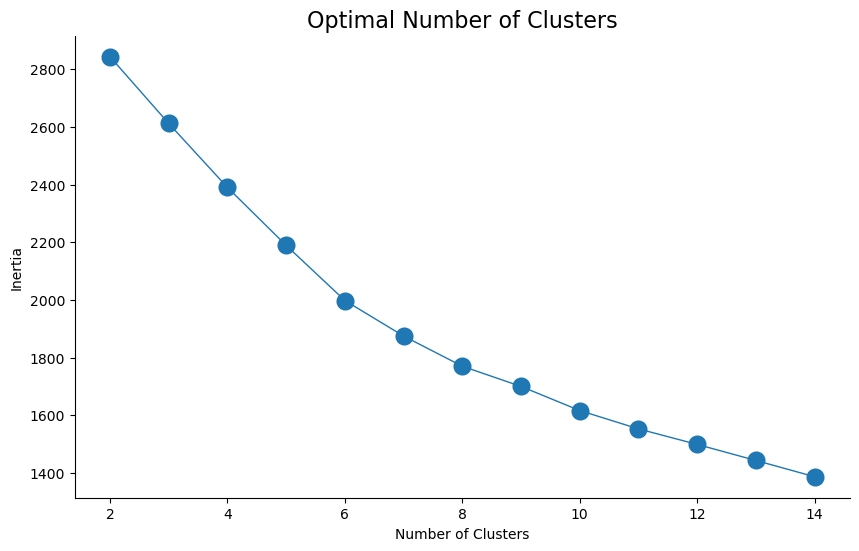

In [543]:
# Number of clusters to try out
n_clusters = list(range(2, 15))

# Run kmeans for each value of k
inertias = []
for k in n_clusters:
    
    # Initialize and run
    kmeans = KMeans(n_clusters=k, n_init=20)
    kmeans.fit(amenities_nb_scaled)
    
    # Save the "inertia"
    inertias.append(kmeans.inertia_)
    
# Plot it!
plt.figure(figsize=(10, 6))  # Adjust the figure size if needed
plt.plot(n_clusters, inertias, marker='o', ms=10, lw=1, mew=3)

# Add title
plt.title("Optimal Number of Clusters", fontsize=16)

# Remove the spines (box) around the plot
ax = plt.gca()  # Get current axes
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_visible(True)
ax.spines['bottom'].set_visible(True)

# Optionally, you can add labels to the axes if needed
plt.xlabel("Number of Clusters")
plt.ylabel("Inertia")

# Use the KneeLocator to find the knee point
kn = KneeLocator(n_clusters, inertias, curve='convex', direction='decreasing')

# Print out the knee
print("Elbow point at:", kn.knee)

# Show the plot
plt.show()

We then initialize the 7 clusters

In [544]:
kmeans = KMeans(n_clusters=7, random_state=42, n_init=20)

Using StandardScaler(), we create a scaled version of our data to account for differences in the scales of the amenity types.

In [545]:
amenities_nb_scaled = scaler.fit_transform(amenities_nb_wide[["arts", "beauty", "education", "entertainment", "grocery", "healthcare", "historic", "kids", "nightlife", "parks", "restaurant", "shopping"]])

We fit this scaled data and extract the resulting cluster labels, which we merge with our wide dataset.

In [578]:
# Perform the fit
kmeans.fit(amenities_nb_scaled)

# Extract the labels
amenities_nb_wide['cluster'] = kmeans.labels_

We join the resulting dataframe with our initial tract boundaries, making it a geodataframe. We then rename the clusters based on their predominant amenity profile.

In [579]:
amenities_clusters = amenities_nb_wide.merge(phl_tract, how = "left", on = "nb_name")
amenities_clusters_gdf = gpd.GeoDataFrame(amenities_clusters, geometry = "geometry")

In [584]:
# Define the mapping for cluster labels
cluster_names = {
    0: "Restaurants and services",
    1: "Culture and leisure",
    2: "Shopping and services",
    3: "Wellness and retail",
    4: "Arts and culture",
    5: "Family friendly recreation",
    6: "Beauty and grooming services"
}

# Replace the cluster labels with the new names
amenities_clusters_gdf['cluster'] = amenities_clusters_gdf['cluster'].replace(cluster_names)

When mapped by cluster, we see clear spatial patterns in the amenity profiles of neighborhoods.

In [585]:
amenities_clusters_gdf.explore(
    column="cluster",
    categorical=True,
    legend=True,
    tiles="CartoDB positron"
)

In [549]:
# Calculate the mean values of the amenities
mean_values = amenities_nb_wide.groupby("label")[["arts", "beauty", "education", "entertainment", "grocery", "healthcare", "historic", "kids", "nightlife", "parks", "restaurant", "shopping"]].mean().reset_index().round(0)

# Calculate the counts for each label
counts = amenities_nb_wide['label'].value_counts().rename('tracts')

# Merge the mean values and counts into one DataFrame
cluster_profile = pd.concat([mean_values, counts], axis=1)

cluster_profile

,label,arts,beauty,education,entertainment,grocery,healthcare,historic,kids,nightlife,parks,restaurant,shopping,tracts
0,0,1.0,18.0,6.0,2.0,7.0,0.0,0.0,3.0,6.0,1.0,51.0,5.0,94
1,1,3.0,13.0,10.0,15.0,5.0,0.0,10.0,8.0,12.0,5.0,9.0,9.0,8
2,2,1.0,21.0,6.0,5.0,9.0,0.0,0.0,5.0,11.0,1.0,18.0,23.0,58
3,3,1.0,19.0,3.0,6.0,16.0,8.0,0.0,5.0,6.0,10.0,12.0,14.0,4
4,4,11.0,8.0,12.0,16.0,10.0,0.0,0.0,4.0,18.0,3.0,8.0,9.0,37
5,5,1.0,16.0,9.0,3.0,4.0,0.0,0.0,15.0,13.0,11.0,26.0,2.0,29
6,6,1.0,45.0,7.0,2.0,8.0,0.0,0.0,1.0,4.0,0.0,26.0,7.0,50


## Cluster 0: Restaurants and services

In [550]:
amenities_clusters_gdf[amenities_clusters_gdf["label"] == 0].explore(
    legend=True,
    tiles="CartoDB positron",
    color = "turquoise"
)

## Cluster 1: Cultural & Leisure

In [551]:
amenities_clusters_gdf[amenities_clusters_gdf["label"] == 1].explore(
    legend=True,
    tiles="CartoDB positron",
    color = "turquoise"
)

## Cluster 2: Shopping and services

In [552]:
amenities_clusters_gdf[amenities_clusters_gdf["label"] == 2].explore(
    legend=True,
    tiles="CartoDB positron",
    color = "turquoise"
)

## Cluster 3: Wellness and retail

In [553]:
amenities_clusters_gdf[amenities_clusters_gdf["label"] == 3].explore(
    legend=True,
    tiles="CartoDB positron",
    color = "turquoise"
)

## Cluster 4: Arts and culture

In [554]:
amenities_clusters_gdf[amenities_clusters_gdf["label"] == 4].explore(
    legend=True,
    tiles="CartoDB positron",
    color = "turquoise"
)

## Cluster 5: Family friendly recreation

In [555]:
amenities_clusters_gdf[amenities_clusters_gdf["label"] == 5].explore(
    legend=True,
    tiles="CartoDB positron",
    color = "turquoise"
)

## Cluster 6: Beauty and grooming services

In [556]:
amenities_clusters_gdf[amenities_clusters_gdf["label"] == 6].explore(
    legend=True,
    tiles="CartoDB positron",
    color = "turquoise"
)